In [1]:
#import libraries
import pandas as pd #
import pytesseract #
print('pyt:',pytesseract.get_tesseract_version())
from PIL import Image #
import PIL
print('pillow:',PIL.__version__)
# import cv2
import numpy as np #
# import os.path
import urllib.request #urllib3
from skimage.filters import  threshold_sauvola #
filecounter = 0
from skimage import data #
from skimage.data import page #
from skimage.filters import  threshold_sauvola #

pyt: 5.0.0-alpha.20200328
pillow: 7.1.2


In [10]:
import skimage
skimage.__version__

'0.16.2'

In [2]:
links = pd.read_csv('links_indexing.csv')


In [3]:
year_links = links.loc[links['MN_year'] == '1850-51'] #subset dataframe with only 1850-51 rows

In [4]:
#first set of links
 #getting all from links (from , to corresponds to the subset of links to be used from the scraped ones)
 #getting all to links
from_url =year_links.iloc[0]['FROM_LINK']
to_url = year_links.iloc[0]['TO_LINK']

In [5]:
#part 1
#getting urls
file = open('MN_scrapedlinks\MN_1850-51.txt','r')
Lines = file.read().splitlines()
# print(Lines)
subset_urls = []
flag = False
for item in Lines:
    if(item == from_url):
        flag = True
    if(flag == True):
        subset_urls.append(item)
    if(item == to_url):
        flag = False
        break


In [6]:
image = Image.open(urllib.request.urlopen('http://link.nypl.org/YaM1vgXiR9ivhW3dG5ai-wv'))


In [7]:
#running on first one
# from_ url = 'http://link.nypl.org/YaM1vgXiR9ivhW3dG5ai-wv' #-- start
image = Image.open(urllib.request.urlopen(from_url))

# cropping 
width, height = image.size   # Get dimensions
left = width/4
top =  height/5
right = 4 * width/5
bottom = 3.5 * height/5
cropped_example = image.crop((left, top, right, bottom))

#rotating
rotated = cropped_example.transpose(Image.ROTATE_270)

#local thresholding
from skimage import data
from skimage.data import page
from skimage.filters import  threshold_sauvola

grayimage = rotated.convert('L')
f_image = np.asarray(grayimage)
t_sauvola = threshold_sauvola(f_image, window_size=23)
binary_image = f_image > t_sauvola
#saving binary image as a tif (required for obtaining hocr format from tesseract)
new_im = Image.fromarray(binary_image)


In [13]:
from pytesseract import pytesseract
new_im.save("saved.tif")
pytesseract.run_tesseract('saved.tif', 'output', lang=None, config="hocr", extension="hocr")

In [14]:

x = !hocr-detect-columns --mode json output.hocr

In [16]:
print(x.n)

{
  "config": {
    "columnCount": 2,
    "characterWidth": 25,
    "minLinesPerColumn": 50
  },
  "pages": [
    {
      "number": 0,
      "properties": {
        "image": "saved.tif",
        "bbox": [
          0,
          0,
          1872,
          3089
        ],
        "ppageno": 0
      },
      "lines": [
        {
          "properties": {
            "bbox": [
              154,
              266,
              914,
              300
            ],
            "baseline": [
              0,
              -8
            ],
            "x_size": 33,
            "x_descenders": 7,
            "x_ascenders": 9
          },
          "text": "Ackley\n      Addison,\n      clerk,\n      47\n      Broadway,\n      h.\n      39\n      Pearl",
          "columnIndex": 0,
          "completeText": "Ackley\n      Addison,\n      clerk,\n      47\n      Broadway,\n      h.\n      39\n      Pearl"
        },
        {
          "properties": {
            "bbox": [
              153,

In [9]:
#save json file
filecounter += 1
with open('tess_output/MN_1850-51/page{}.json'.format(filecounter), 'w',encoding="utf-8") as f:
    f.write(x.n)

In [10]:
#running on second type page
# from_ url = 'http://link.nypl.org/YaM1vgXiR9ivhW3dG5ai-wv' #-- start
image = Image.open(urllib.request.urlopen(to_url))

# cropping 
width, height = image.size   # Get dimensions
left = width/4
top =  height/5
right = 4 * width/5
bottom = 3.5 * height/5
cropped_example = image.crop((left, top, right, bottom))

#rotating
rotated = cropped_example.transpose(Image.ROTATE_90)

#local thresholding


grayimage = rotated.convert('L')
f_image = np.asarray(grayimage)
t_sauvola = threshold_sauvola(f_image, window_size=23)
binary_image = f_image > t_sauvola
#saving binary image as a tif (required for obtaining hocr format from tesseract)
new_im = Image.fromarray(binary_image)
#create hocr file
new_im.save("saved.tif")
!tesseract "saved.tif" "hocr_output" -c tessedit_create_hocr=1


Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 295


In [11]:

x = !hocr-detect-columns --mode json hocr_output.hocr

            ],
            "baseline": [
              0,
              -7
            ],
            "x_size": 32,
            "x_descenders": 7,
            "x_ascenders": 8
          },
          "text": "Jackson\n      Lorig,\n      shipcarpenter,\n      297\n      Third",
          "columnIndex": 0,
          "completeText": "Jackson\n      Lorig,\n      shipcarpenter,\n      297\n      Third"
        },
        {
          "properties": {
            "bbox": [
              1057,
              1431,
              1657,
              1457
            ],
            "baseline": [
              0,
              0
            ],
            "x_size": 30.880224,
            "x_descenders": 6.8802242,
            "x_ascenders": 7
          },
          "text": "Jacobson\n      John\n      C.\n      com.\n      mer.\n      121\n      Water",
          "columnIndex": 0,


In [12]:
#save json file
filecounter += 1
with open('tess_output/MN_1850-51/page{}.json'.format(filecounter), 'w',encoding="utf-8") as f:
    f.write(x.n)

          "completeText": "Jacobson\n      John\n      C.\n      com.\n      mer.\n      121\n      Water"
        },
        {
          "properties": {
            "bbox": [
              1058,
              1461,
              1802,
              1497
            ],
            "baseline": [
              0,
              -8
            ],
            "x_size": 29,
            "x_descenders": 4,
            "x_ascenders": 8
          },
          "text": "Jenings\n      Chester,\n      late\n      City\n      Hotel,\n      h.\n      Astor\n      House",
          "columnIndex": 0,
          "completeText": "Jenings\n      Chester,\n      late\n      City\n      Hotel,\n      h.\n      Astor\n      House"
        },
        {
          "properties": {
            "bbox": [
              1058,
              1494,
              1673,
              1528
            ],
            "baseline": [
              0,
              -7
            ],
            "x_size": 32,
            "x_desc

In [13]:
#second set of links

from_url =year_links.iloc[1]['FROM_LINK']
to_url = year_links.iloc[1]['TO_LINK']

In [14]:
#part 1
#getting urls
file = open('MN_scrapedlinks\MN_1850-51.txt','r')
Lines = file.read().splitlines()
# print(Lines)
subset_urls = []
flag = False
for item in Lines:
#         print(item)
    if(item == from_url):
    #             print('found')
        flag = True
    if(flag == True):
        subset_urls.append(item)
    if(item == to_url):
#         subset_urls.append(item)
        flag = False
        break
# subset_urls

In [ ]:
filecounter = 2
for i  in range(len(subset_urls)):
    if(i % 2 == 0):

        image = Image.open(urllib.request.urlopen(subset_urls[i]))
        # display(image)

        # cropping 
        width, height = image.size   # Get dimensions
        left = width/4
        top =  height/5
        right = 4 * width/5
        bottom = 3.5 * height/5
        cropped_example = image.crop((left, top, right, bottom))
        # display(cropped_example)

        #rotating
        rotated = cropped_example.transpose(Image.ROTATE_90)
#         display(rotated)

        #local thresholding

        grayimage = rotated.convert('L')
        f_image = np.asarray(grayimage)
        t_sauvola = threshold_sauvola(f_image, window_size=23)
        binary_image = f_image > t_sauvola
        #saving binary image as a tif (required for obtaining hocr format from tesseract)
        new_im = Image.fromarray(binary_image)
        #create hocr file
        new_im.save("saved.tif")
        !tesseract "saved.tif" "hocr_output" -c tessedit_create_hocr=1
        x = !hocr-detect-columns --mode json hocr_output.hocr
        #save json file
        filecounter += 1
        with open('tess_output/MN_1850-51/page{}.json'.format(filecounter), 'w',encoding="utf-8") as f:
            f.write(x.n)
    else:
        image = Image.open(urllib.request.urlopen(subset_urls[i]))
        # display(image)

        # cropping 
        width, height = image.size   # Get dimensions
        left = width/4
        top =  height/5
        right = 4 * width/5
        bottom = 3.5 * height/5
        cropped_example = image.crop((left, top, right, bottom))
        # display(cropped_example)

        #rotating
        rotated = cropped_example.transpose(Image.ROTATE_270)
#         display(rotated)

        #local thresholding

        grayimage = rotated.convert('L')
        f_image = np.asarray(grayimage)
        t_sauvola = threshold_sauvola(f_image, window_size=23)
        binary_image = f_image > t_sauvola
        #saving binary image as a tif (required for obtaining hocr format from tesseract)
        new_im = Image.fromarray(binary_image)
        #create hocr file
        new_im.save("saved.tif")
        !tesseract "saved.tif" "hocr_output" -c tessedit_create_hocr=1
        x = !hocr-detect-columns --mode json hocr_output.hocr
        #save json file
        filecounter += 1
        with open('tess_output/MN_1850-51/page{}.json'.format(filecounter), 'w',encoding="utf-8") as f:
            f.write(x.n)



Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 301
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 296
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 297
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 302
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 297
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 296
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 294
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 294
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 293
Error in boxClipToRectangle: box outside recta

In [5]:
#second set of links

from_url =year_links.iloc[2]['FROM_LINK']
to_url = year_links.iloc[2]['TO_LINK']

In [6]:
#part 1
#getting urls
file = open('MN_scrapedlinks\MN_1850-51.txt','r')
Lines = file.read().splitlines()
# print(Lines)
subset_urls = []
flag = False
for item in Lines:
#         print(item)
    if(item == from_url):
    #             print('found')
        flag = True
    if(flag == True):
        subset_urls.append(item)
    if(item == to_url):
#         subset_urls.append(item)
        flag = False
        break
# subset_urls

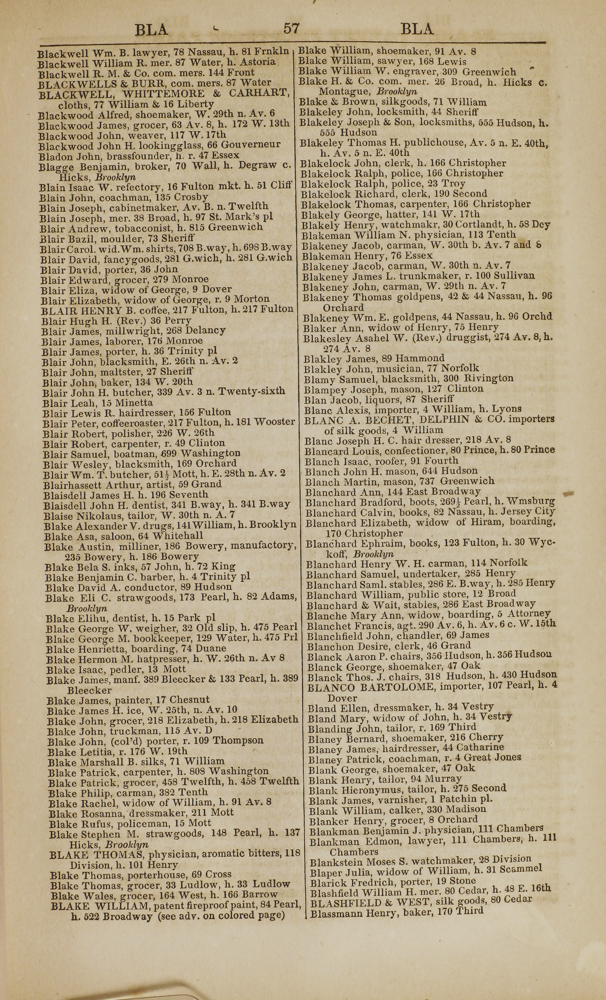

In [7]:
# #testing
# image = Image.open(urllib.request.urlopen(subset_urls[0]))
# # display(image)

# # cropping 
# width, height = image.size   # Get dimensions
# left = width/4
# top =  height/5
# right = 4 * width/5
# bottom = 3.5 * height/5
# cropped_example = image.crop((left, top, right, bottom))
# # display(cropped_example)

# #rotating
# rotated = cropped_example.transpose(Image.ROTATE_90)
# display(rotated)


In [14]:
# filecounter = 16
# for i  in range(len(subset_urls)):
#     if(i % 2 == 0):

#         image = Image.open(urllib.request.urlopen(subset_urls[i]))
#         # display(image)

#         # cropping 
#         width, height = image.size   # Get dimensions
#         left = width/4
#         top =  height/5
#         right = 4 * width/5
#         bottom = 3.5 * height/5
#         cropped_example = image.crop((left, top, right, bottom))
#         # display(cropped_example)

#         #rotating
#         rotated = cropped_example.transpose(Image.ROTATE_90)
# #         display(rotated)

#         #local thresholding

#         grayimage = rotated.convert('L')
#         f_image = np.asarray(grayimage)
#         t_sauvola = threshold_sauvola(f_image, window_size=23)
#         binary_image = f_image > t_sauvola
#         #saving binary image as a tif (required for obtaining hocr format from tesseract)
#         new_im = Image.fromarray(binary_image)
#         #create hocr file
#         new_im.save("saved.tif")
#         !tesseract "saved.tif" "hocr_output" -c tessedit_create_hocr=1
#         x = !hocr-detect-columns --mode json hocr_output.hocr
#         #save json file
#         filecounter += 1
#         with open('tess_output/MN_1850-51/page{}.json'.format(filecounter), 'w',encoding="utf-8") as f:
#             f.write(x.n)
#     else:
#         image = Image.open(urllib.request.urlopen(subset_urls[i]))
#         # display(image)

#         # cropping 
#         width, height = image.size   # Get dimensions
#         left = width/4
#         top =  height/5
#         right = 4 * width/5
#         bottom = 3.5 * height/5
#         cropped_example = image.crop((left, top, right, bottom))
#         # display(cropped_example)

#         #rotating
#         rotated = cropped_example.transpose(Image.ROTATE_270)
# #         display(rotated)

#         #local thresholding

#         grayimage = rotated.convert('L')
#         f_image = np.asarray(grayimage)
#         t_sauvola = threshold_sauvola(f_image, window_size=23)
#         binary_image = f_image > t_sauvola
#         #saving binary image as a tif (required for obtaining hocr format from tesseract)
#         new_im = Image.fromarray(binary_image)
#         #create hocr file
#         new_im.save("saved.tif")
#         !tesseract "saved.tif" "hocr_output" -c tessedit_create_hocr=1
#         x = !hocr-detect-columns --mode json hocr_output.hocr
#         #save json file
#         filecounter += 1
#         with open('tess_output/MN_1850-51/page{}.json'.format(filecounter), 'w',encoding="utf-8") as f:
#             f.write(x.n)



Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 294
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 296
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 289
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 296
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 292
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 291
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 290
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 291
Tesseract Open Source OCR Engine v5.0.0-alpha.20200328 with Leptonica
Page 1
Estimating resolution as 295
Tesseract Open Source OCR Engine v5.0.0-alpha.

HTTPError: HTTP Error 500: Internal Server Error

str

{
  "config": {
    "columnCount": 2,
    "characterWidth": 25,
    "minLinesPerColumn": 50
  },
  "pages": [
    {
      "number": 0,
      "properties": {
        "image": "saved.tif",
        "bbox": [
          0,
          0,
          1872,
          3089
        ],
        "ppageno": 0
      },
      "lines": [
        {
          "properties": {
            "bbox": [
              175,
              0,
              969,
              34
            ],
            "baseline": [
              0,
              -12
            ],
            "x_size": 35,
            "x_descenders": 6,
            "x_ascenders": 6
          },
          "text": "Abrahams\n      Abhm.S.\n      clothier,\n      97\n      Chthm,\n      h.97\n      Chthm",
          "columnIndex": 1,
          "completeText": "Abrahams\n      Abhm.S.\n      clothier,\n      97\n      Chthm,\n      h.97\n      Chthm"
        },
        {
          "properties": {
            "bbox": [
              175,
              3

              0,
              -7
            ],
            "x_size": 33,
            "x_descenders": 8,
            "x_ascenders": 8
          },
          "text": "Ackerly\n      Henry\n      S.\n      pianofortes,\n      170\n      E.\n      27th",
          "columnIndex": 1,
          "completeText": "Ackerly\n      Henry\n      S.\n      pianofortes,\n      170\n      E.\n      27th"
        },
        {
          "properties": {
            "bbox": [
              159,
              1749,
              818,
              1779
            ],
            "baseline": [
              0,
              -5
            ],
            "x_size": 31,
            "x_descenders": 6,
            "x_ascenders": 8
          },
          "text": "â€˜Ackerman\n      Abram,\n      shoemaker,\n      r.\n      53\n      Bank",
          "columnIndex": 1,
          "completeText": "â€˜Ackerman\n      Abram,\n      shoemaker,\n      r.\n      53\n      Bank"
        },
        {
          "properties"

              0,
              -11
            ],
            "x_size": 34,
            "x_descenders": 8,
            "x_ascenders": 8
          },
          "text": "Ackerman\n      &\n      Miller,\n      sign\n      &\n      banner\n      painters\n      &",
          "columnIndex": 0,
          "nextLineIndex": 111,
          "completeText": "Ackerman\n      &\n      Miller,\n      sign\n      &\n      banner\n      painters\n      & block\n      letter\n      manf.\n      103\n      Nassau"
        },
        {
          "properties": {
            "bbox": [
              1054,
              1005,
              1518,
              1032
            ],
            "baseline": [
              0,
              -2
            ],
            "x_size": 31.520254,
            "x_descenders": 6.5202546,
            "x_ascenders": 8
          },
          "text": "block\n      letter\n      manf.\n      103\n      Nassau",
          "previousLineIndex": 110
        },
        {
          "